In [1]:
from tensorflow.python.client import device_lib

device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 11638965955991034572
 xla_global_id: -1,
 name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 9920577536
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 8855700069796585452
 physical_device_desc: "device: 0, name: NVIDIA GeForce RTX 3080, pci bus id: 0000:07:00.0, compute capability: 8.6"
 xla_global_id: 416903419]

In [2]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Reshape, Dropout, Dense 
from tensorflow.keras.layers import Flatten, BatchNormalization
from tensorflow.keras.layers import Activation, ZeroPadding2D
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.layers import UpSampling2D, Conv2D
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.optimizers import Adam
import numpy as np
from PIL import Image
from tqdm import tqdm
import os 
import time
import matplotlib.pyplot as plt
import glob

!kaggle datasets download -d gasgallo/faces-data-new

!unzip faces-data-new.zip

In [3]:
GENERATE_RES = 3 # Generation resolution factor 
# (1=32, 2=64, 3=96, 4=128, etc.)
GENERATE_SQUARE = 32 * GENERATE_RES # rows/cols (should be square)
IMAGE_CHANNELS = 3

# Preview image 
PREVIEW_ROWS = 4
PREVIEW_COLS = 7
PREVIEW_MARGIN = 16

# Size vector to generate images from
SEED_SIZE = 100

# Configuration
DATA_PATH = 'out_photo'
EPOCHS = 50
BATCH_SIZE = 32
BUFFER_SIZE = 60000

print(f"Will generate {GENERATE_SQUARE}px square images.")

Will generate 96px square images.


In [4]:
def hms_string(sec_elapsed):
    h = int(sec_elapsed / (60 * 60))
    m = int((sec_elapsed % (60 * 60)) / 60)
    s = sec_elapsed % 60
    return "{}:{:>02}:{:>05.2f}".format(h, m, s)

In [5]:
data = []
data_root = 'images/'
for fpath in glob.glob(os.path.join(data_root, '*.jpg')):
    data.append(fpath)

In [6]:
def load_n_proc_img(item):
    # Здесь item - путь до фотки, который в бинарном формате завернут в тензор
    image = tf.io.read_file(item)
    image = tf.image.decode_image(image)
    image = (tf.dtypes.cast(image, tf.float32) - 127.5)/127.5
    image = tf.image.resize(image, [GENERATE_SQUARE, GENERATE_SQUARE])
    return image

def item_to_video(item):
    video = tf.py_function(load_n_proc_img, [item], [tf.float32])
    return video

In [7]:
train_dataset = tf.data.Dataset.from_tensor_slices(data)
train_dataset = train_dataset.map(item_to_video)
#train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [8]:
samples = iter(train_dataset)
sample = samples.next()
sample[0].shape

TensorShape([32, 96, 96, 3])

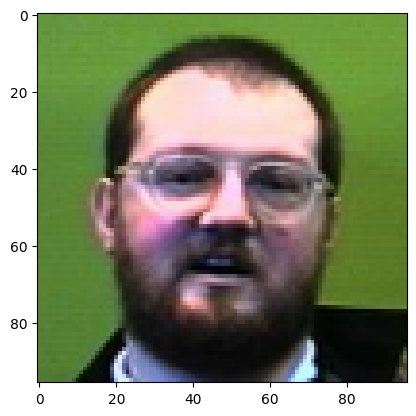

In [9]:
plt.imshow((sample[0][10, ..., :]+ 1.0) / 2.0)

In [10]:
def build_generator(seed_size, channels):
    model = Sequential()

    model.add(Dense(4*4*256,activation="relu",input_dim=seed_size))
    model.add(Reshape((4,4,256)))

    model.add(UpSampling2D())
    model.add(Conv2D(256,kernel_size=3,padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))

    model.add(UpSampling2D())
    model.add(Conv2D(256,kernel_size=3,padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))
   
    # Output resolution, additional upsampling
    model.add(UpSampling2D())
    model.add(Conv2D(128,kernel_size=3,padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))

    if GENERATE_RES>1:
        model.add(UpSampling2D(size=(GENERATE_RES,GENERATE_RES)))
        model.add(Conv2D(128,kernel_size=3,padding="same"))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Activation("relu"))

    # Final CNN layer
    model.add(Conv2D(channels,kernel_size=3,padding="same"))
    model.add(Activation("tanh"))

    return model


def build_discriminator(image_shape):
    model = Sequential()

    model.add(Conv2D(32, kernel_size=3, strides=2, input_shape=image_shape, 
                     padding="same"))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Dropout(0.25))
    model.add(Conv2D(64, kernel_size=3, strides=2, padding="same"))
    model.add(ZeroPadding2D(padding=((0,1),(0,1))))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Dropout(0.25))
    model.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Dropout(0.25))
    model.add(Conv2D(256, kernel_size=3, strides=1, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Dropout(0.25))
    model.add(Conv2D(512, kernel_size=3, strides=1, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Dropout(0.25))
    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))

    return model

In [11]:
def save_images(cnt, noise):
    image_array = np.full(( 
      PREVIEW_MARGIN + (PREVIEW_ROWS * (GENERATE_SQUARE+PREVIEW_MARGIN)), 
      PREVIEW_MARGIN + (PREVIEW_COLS * (GENERATE_SQUARE+PREVIEW_MARGIN)), 3), 
      255, dtype=np.uint8)
  
    generated_images = generator.predict(noise)

    generated_images = 0.5 * generated_images + 0.5

    image_count = 0
    for row in range(PREVIEW_ROWS):
        for col in range(PREVIEW_COLS):
            r = row * (GENERATE_SQUARE+16) + PREVIEW_MARGIN
            c = col * (GENERATE_SQUARE+16) + PREVIEW_MARGIN
            image_array[r:r+GENERATE_SQUARE,c:c+GENERATE_SQUARE] \
            = generated_images[image_count] * 255
            image_count += 1

          
    output_path = os.path.join(DATA_PATH,'output')
    if not os.path.exists(output_path):
        os.makedirs(output_path)
  
    filename = os.path.join(output_path,f"train-{cnt}.png")
    im = Image.fromarray(image_array)
    im.save(filename)

In [12]:
def plot_images(samples):
    fig = plt.figure(figsize=(20, 20))
    num = samples.shape[0]
    for j in range(num):
        ax = fig.add_subplot(8, 8, j+1)
        #ax.imshow(samples[j, ...,0], cmap='gray') # для серого в диапазоне [0; 1]
        #ax.imshow((samples[j, ...,:]) # для цветного в диапазоне [0; 1]
        ax.imshow((samples[j, ...,:] + 1.0) / 2.0)  # для цветного в диапазоне [-1; 1]
        plt.xticks([]), plt.yticks([])
    plt.show()

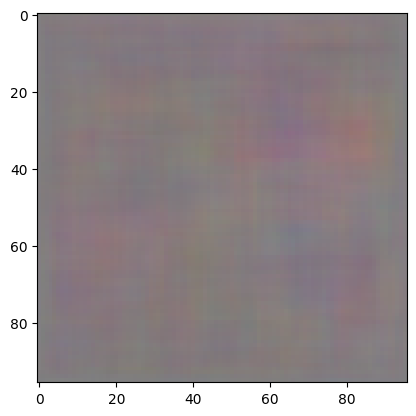

In [13]:
generator = build_generator(SEED_SIZE, IMAGE_CHANNELS)

noise = tf.random.normal([1, SEED_SIZE])
generated_image = generator(noise, training=False)

plt.imshow((generated_image[0, :, :, :] + 1.0) / 2.0)

In [14]:
image_shape = (GENERATE_SQUARE,GENERATE_SQUARE,IMAGE_CHANNELS)

discriminator = build_discriminator(image_shape)
decision = discriminator(generated_image)
print (decision)

tf.Tensor([[0.5001906]], shape=(1, 1), dtype=float32)


In [15]:
# This method returns a helper function to compute cross entropy loss
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

In [16]:
generator_optimizer = tf.keras.optimizers.Adam(1.5e-4,0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(1.5e-4,0.5)

In [17]:
@tf.function
def train_step(images):
    seed = tf.random.normal([BATCH_SIZE, SEED_SIZE])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(seed, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)
    

        gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
        gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

        generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
        discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    return gen_loss,disc_loss

In [18]:
def train(dataset, epochs):
    fixed_seed = np.random.normal(0, 1, (PREVIEW_ROWS * PREVIEW_COLS, SEED_SIZE))
    start = time.time()

    for epoch in range(epochs):
        epoch_start = time.time()

        gen_loss_list = []
        disc_loss_list = []

        for image_batch in dataset:
            t = train_step(image_batch)
            gen_loss_list.append(t[0])
            disc_loss_list.append(t[1])

        g_loss = sum(gen_loss_list) / len(gen_loss_list)
        d_loss = sum(disc_loss_list) / len(disc_loss_list)

        epoch_elapsed = time.time()-epoch_start
        print (f'Epoch {epoch+1}, gen loss={g_loss},disc loss={d_loss}, {hms_string(epoch_elapsed)}')
        save_images(epoch, fixed_seed)

        # Вывод картинок
        noise = tf.random.normal([6, SEED_SIZE])
        generated_image = generator(noise, training=False)
        plot_images(generated_image)

    elapsed = time.time()-start
    print (f'Training time: {hms_string(elapsed)}')

Epoch 1, gen loss=3.913116216659546,disc loss=0.6849265098571777, 0:00:20.83
1/1 [==============================] - 0s 13ms/step


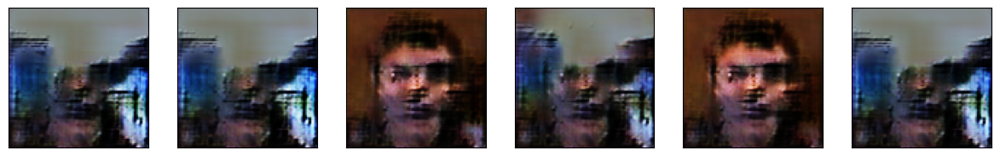

Epoch 2, gen loss=4.090301990509033,disc loss=0.7031866908073425, 0:00:20.80
1/1 [==============================] - 0s 13ms/step


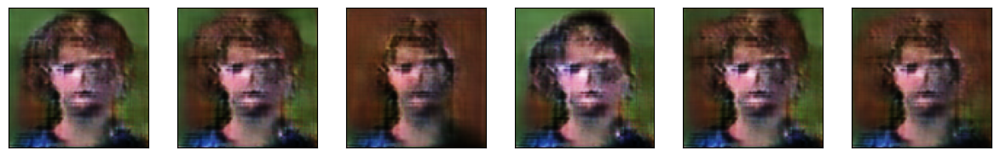

Epoch 3, gen loss=4.220910549163818,disc loss=0.9397836923599243, 0:00:21.37
1/1 [==============================] - 0s 16ms/step


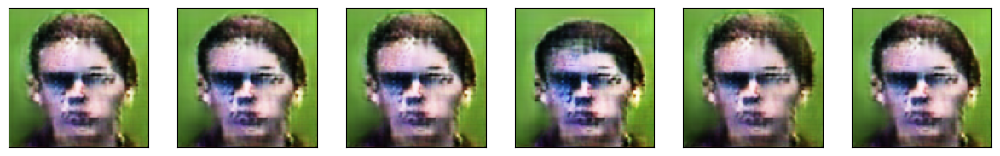

Epoch 4, gen loss=3.713745594024658,disc loss=0.8233105540275574, 0:00:22.25
1/1 [==============================] - 0s 16ms/step


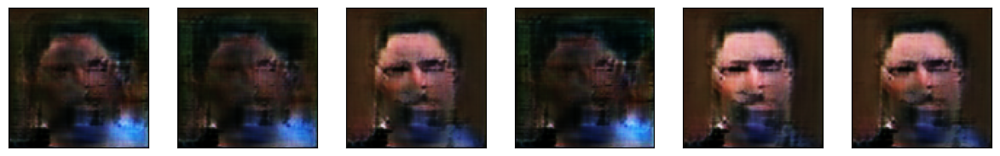

Epoch 5, gen loss=4.16229772567749,disc loss=0.7046921253204346, 0:00:39.01
1/1 [==============================] - 0s 35ms/step


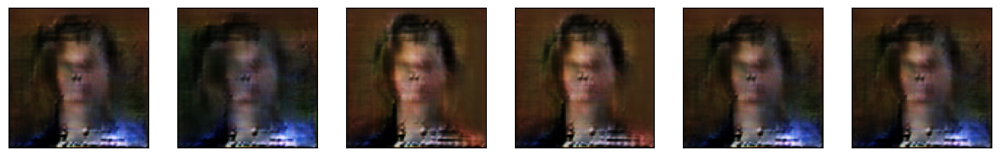

Epoch 6, gen loss=4.193637371063232,disc loss=0.7767098546028137, 0:00:28.76
1/1 [==============================] - 0s 17ms/step


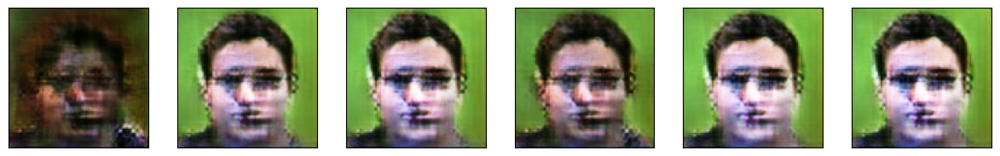

Epoch 7, gen loss=3.9203059673309326,disc loss=0.7662169933319092, 0:01:07.63
1/1 [==============================] - 0s 16ms/step


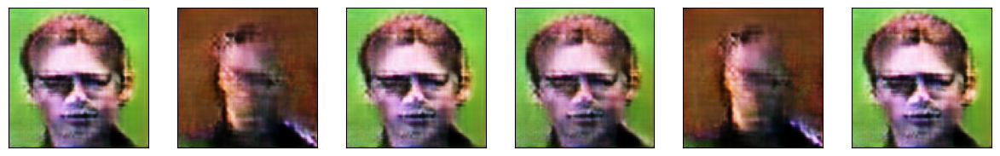

Epoch 8, gen loss=4.041861057281494,disc loss=0.860531747341156, 0:01:24.29
1/1 [==============================] - 0s 16ms/step


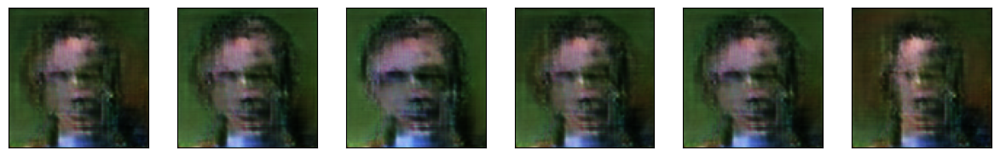

Epoch 9, gen loss=3.8614091873168945,disc loss=0.7638365626335144, 0:01:22.47
1/1 [==============================] - 0s 19ms/step


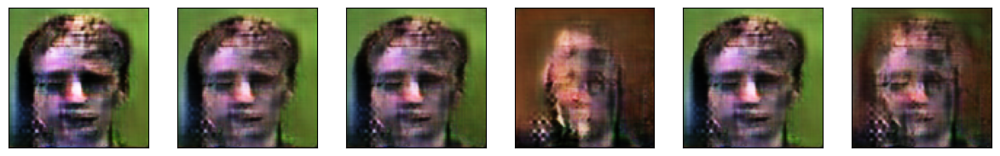

Epoch 10, gen loss=3.905413866043091,disc loss=0.6965487599372864, 0:01:08.85
1/1 [==============================] - 0s 17ms/step


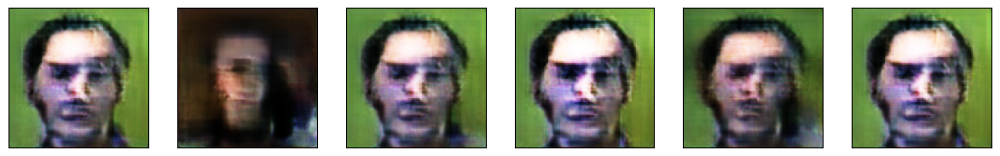

Epoch 11, gen loss=3.8473050594329834,disc loss=0.7497743964195251, 0:01:22.28
1/1 [==============================] - 0s 13ms/step


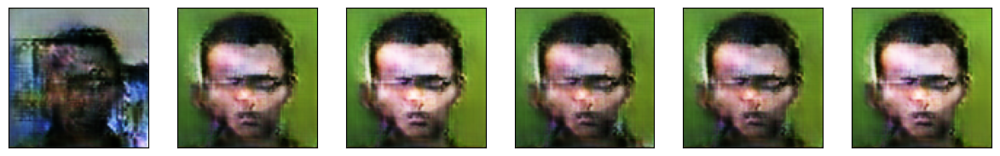

Epoch 12, gen loss=3.911092758178711,disc loss=0.8117453455924988, 0:00:38.82
1/1 [==============================] - 0s 17ms/step


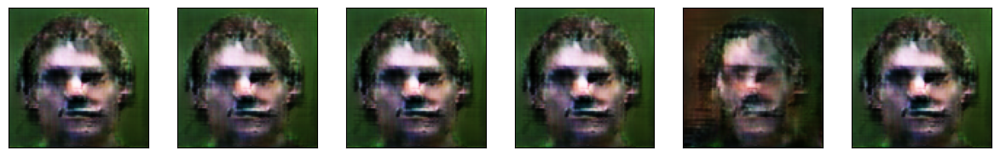

Epoch 13, gen loss=4.383782386779785,disc loss=0.7558639049530029, 0:02:54.23
1/1 [==============================] - 0s 16ms/step


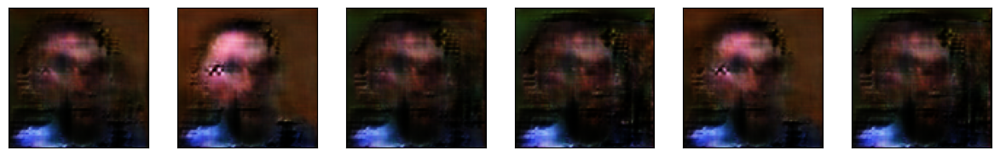

Epoch 14, gen loss=4.101271629333496,disc loss=0.5793784260749817, 0:02:38.56
1/1 [==============================] - 0s 13ms/step


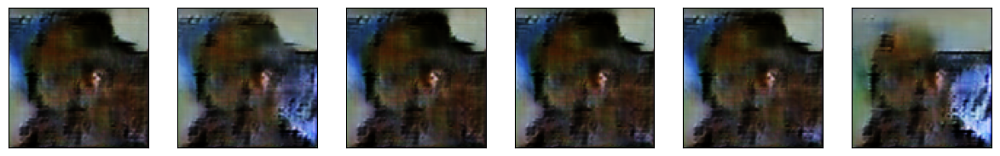

Epoch 15, gen loss=5.157039642333984,disc loss=0.7702228426933289, 0:02:59.14
1/1 [==============================] - 0s 14ms/step


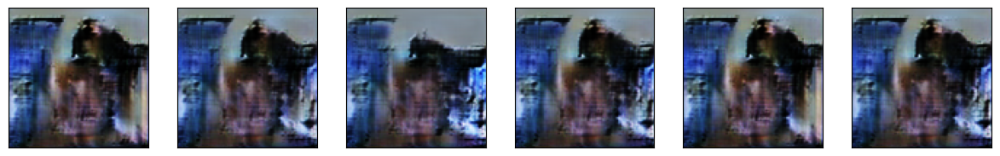

Epoch 16, gen loss=4.869946479797363,disc loss=0.6582082509994507, 0:00:41.51
1/1 [==============================] - 0s 21ms/step


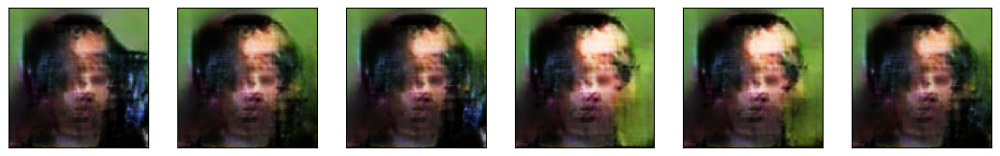

Epoch 17, gen loss=4.142394065856934,disc loss=0.7034362554550171, 0:01:34.60
1/1 [==============================] - 0s 13ms/step


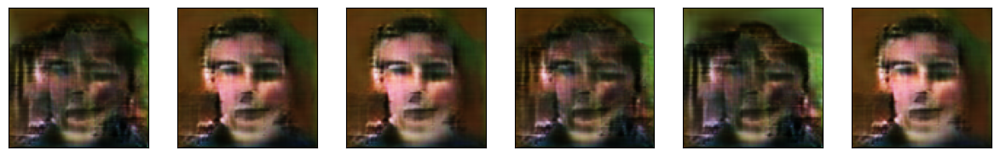

Epoch 18, gen loss=4.2340593338012695,disc loss=0.7621147632598877, 0:01:49.58
1/1 [==============================] - 0s 14ms/step


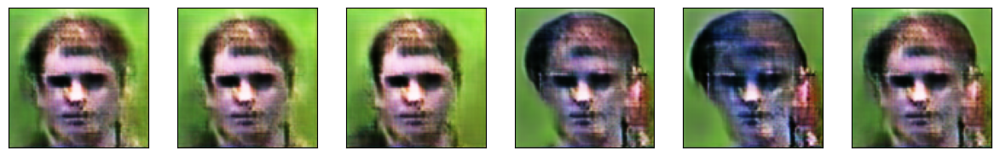

Epoch 19, gen loss=4.024196147918701,disc loss=0.7421672940254211, 0:01:25.65
1/1 [==============================] - 0s 15ms/step


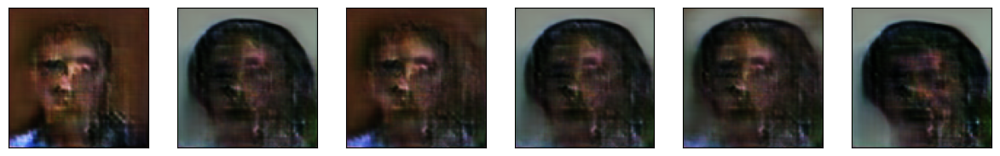

Epoch 20, gen loss=4.453123569488525,disc loss=0.6370084285736084, 0:04:59.68
1/1 [==============================] - 0s 21ms/step


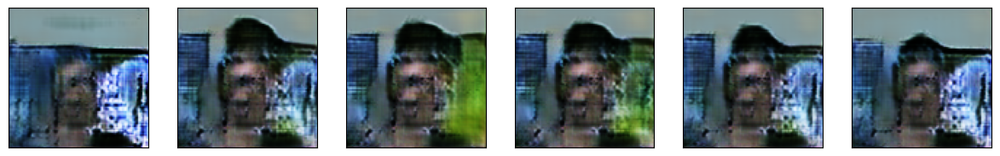

Epoch 21, gen loss=4.635509490966797,disc loss=0.6640864610671997, 0:01:39.27
1/1 [==============================] - 0s 24ms/step


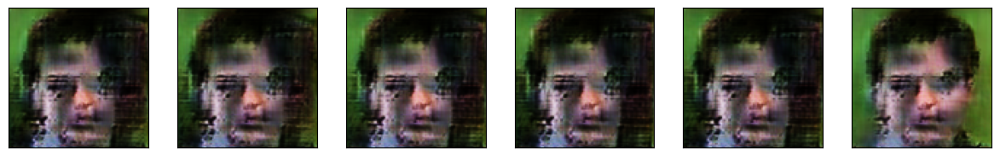

Epoch 22, gen loss=4.434831619262695,disc loss=0.6598687171936035, 0:01:39.15
1/1 [==============================] - 0s 15ms/step


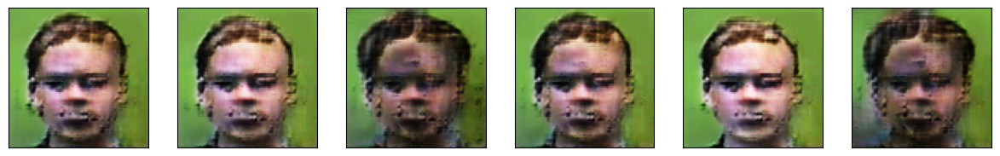

Epoch 23, gen loss=4.234180927276611,disc loss=0.6849198341369629, 0:13:33.14
1/1 [==============================] - 0s 24ms/step


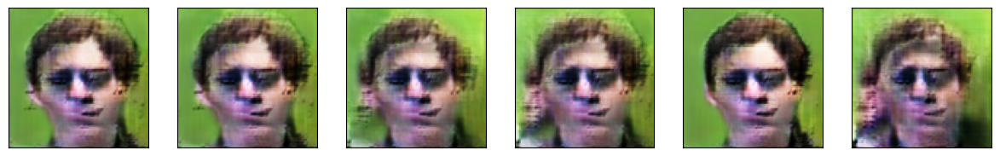

Epoch 24, gen loss=4.103298187255859,disc loss=0.7026296854019165, 0:04:33.56
1/1 [==============================] - 0s 22ms/step


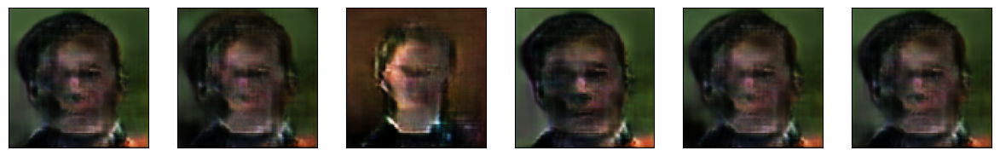

Epoch 25, gen loss=4.081330299377441,disc loss=0.6118946075439453, 0:06:55.87
1/1 [==============================] - 0s 20ms/step


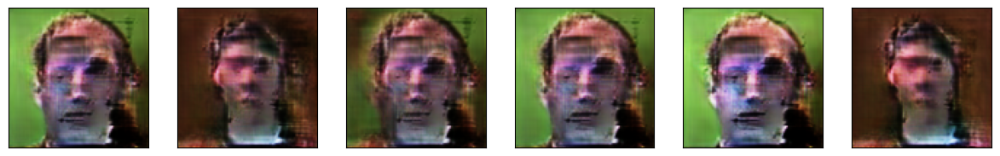

Epoch 26, gen loss=4.514504909515381,disc loss=0.6506062746047974, 0:03:23.74
1/1 [==============================] - 0s 19ms/step


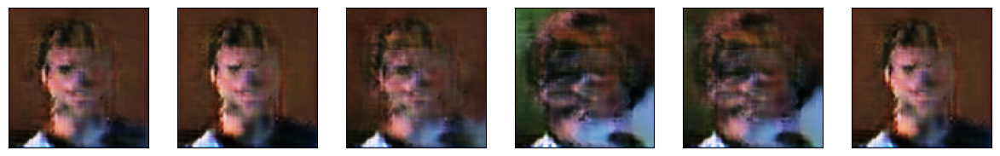

Epoch 27, gen loss=4.385439395904541,disc loss=0.659458339214325, 0:01:15.03
1/1 [==============================] - 0s 21ms/step


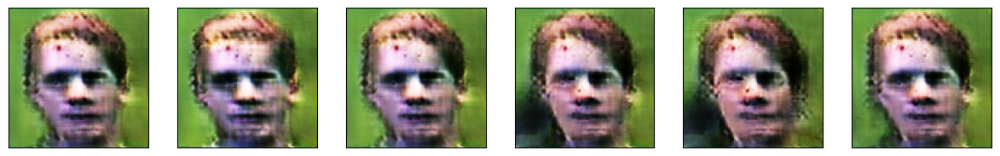

Epoch 28, gen loss=4.5922698974609375,disc loss=0.6247064471244812, 0:05:36.06
1/1 [==============================] - 0s 19ms/step


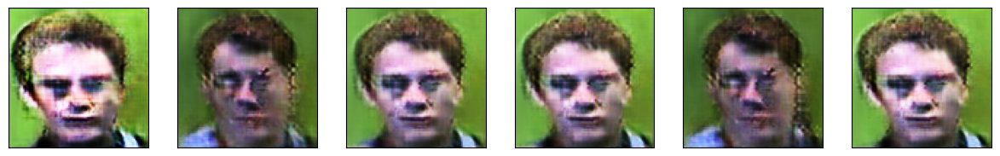

Epoch 29, gen loss=4.269792556762695,disc loss=0.6441901326179504, 0:01:41.34
1/1 [==============================] - 0s 15ms/step


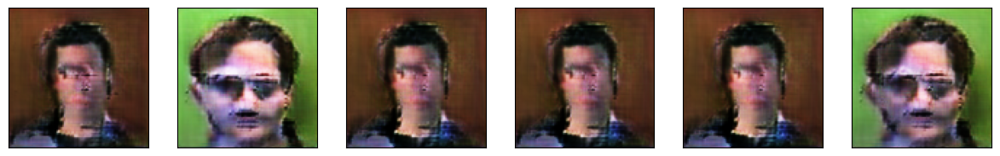

Epoch 30, gen loss=4.1989922523498535,disc loss=0.5057483315467834, 0:03:00.74
1/1 [==============================] - 0s 25ms/step


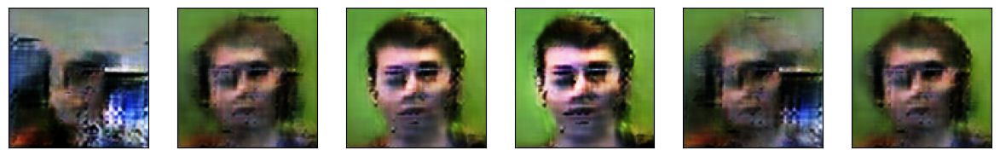

Epoch 31, gen loss=4.376898765563965,disc loss=0.6133050918579102, 0:01:04.18
1/1 [==============================] - 0s 13ms/step


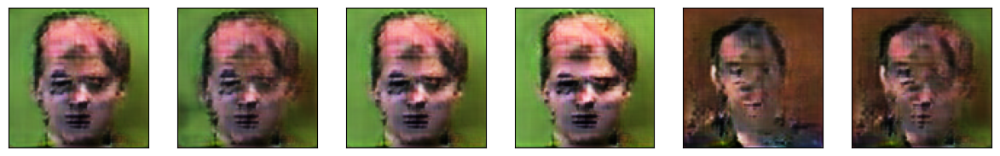

Epoch 32, gen loss=4.567814350128174,disc loss=0.7459539175033569, 0:00:21.28
1/1 [==============================] - 0s 14ms/step


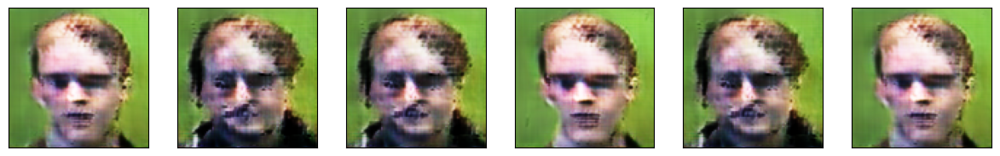

Epoch 33, gen loss=4.439506530761719,disc loss=0.6722458004951477, 0:00:21.05
1/1 [==============================] - 0s 13ms/step


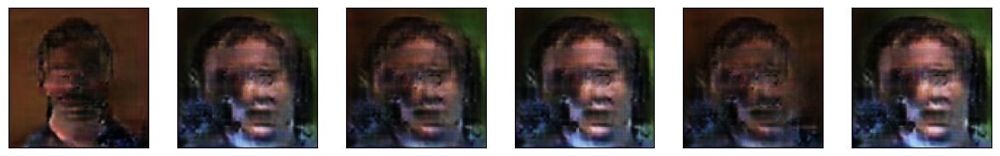

Epoch 34, gen loss=4.392696857452393,disc loss=0.6077555418014526, 0:00:21.08
1/1 [==============================] - 0s 14ms/step


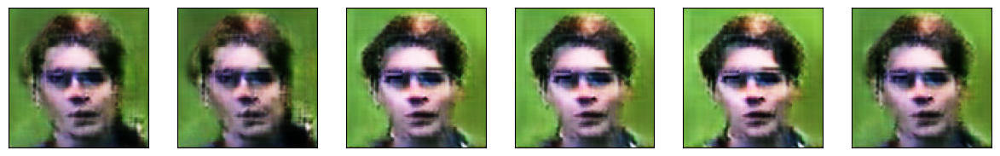

Epoch 35, gen loss=4.400883197784424,disc loss=0.5891844034194946, 0:00:21.12
1/1 [==============================] - 0s 14ms/step


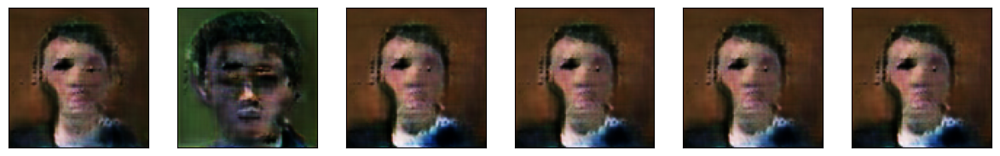

Epoch 36, gen loss=4.23784065246582,disc loss=0.5747711062431335, 0:00:21.04
1/1 [==============================] - 0s 13ms/step


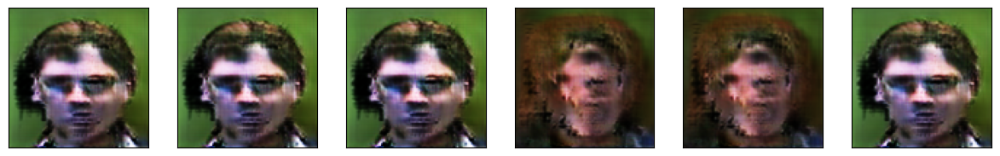

Epoch 37, gen loss=4.472775936126709,disc loss=0.5936307311058044, 0:00:21.19
1/1 [==============================] - 0s 14ms/step


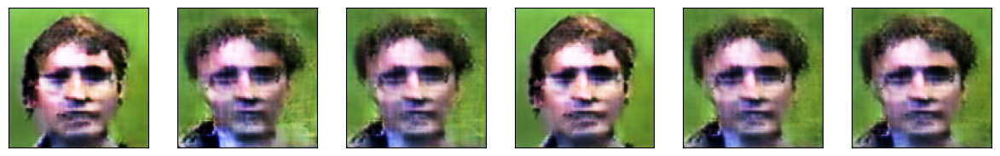

Epoch 38, gen loss=4.28452730178833,disc loss=0.5978263020515442, 0:00:21.00
1/1 [==============================] - 0s 13ms/step


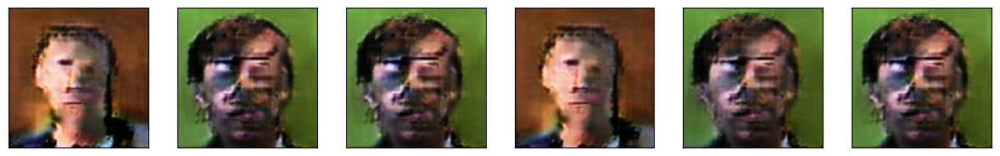

Epoch 39, gen loss=4.805332183837891,disc loss=0.5436438918113708, 0:00:21.04
1/1 [==============================] - 0s 14ms/step


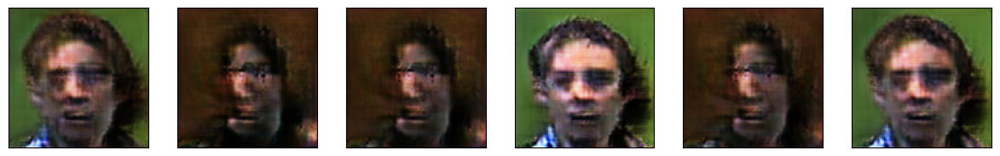

Epoch 40, gen loss=4.285059928894043,disc loss=0.5774112343788147, 0:00:21.39
1/1 [==============================] - 0s 13ms/step


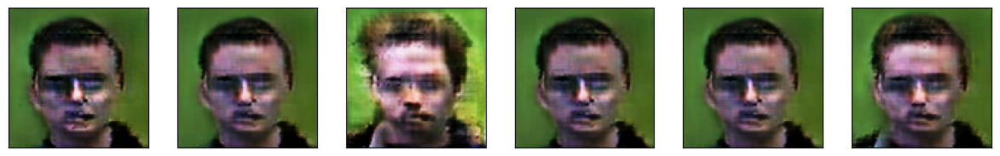

Epoch 41, gen loss=4.595020771026611,disc loss=0.6195850968360901, 0:00:20.94
1/1 [==============================] - 0s 14ms/step


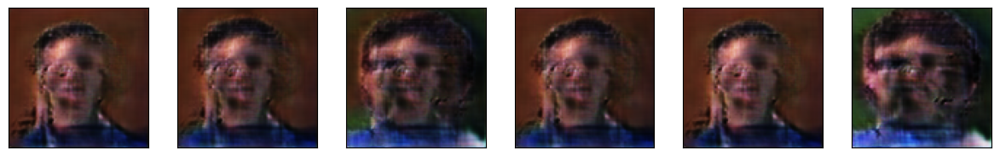

Epoch 42, gen loss=4.879293441772461,disc loss=0.49123415350914, 0:00:21.05
1/1 [==============================] - 0s 13ms/step


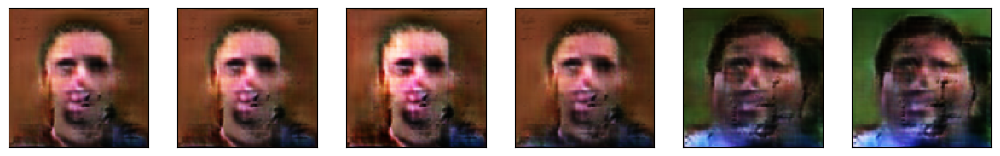

Epoch 43, gen loss=4.485904693603516,disc loss=0.5602596402168274, 0:00:21.06
1/1 [==============================] - 0s 13ms/step


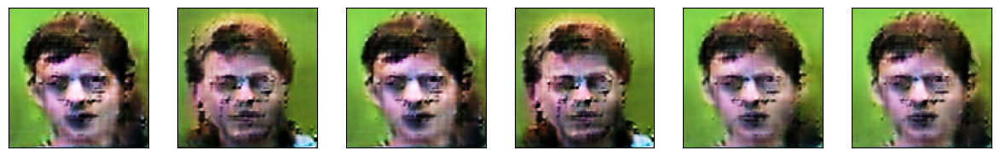

Epoch 44, gen loss=4.4696364402771,disc loss=0.5957651734352112, 0:00:21.22
1/1 [==============================] - 0s 14ms/step


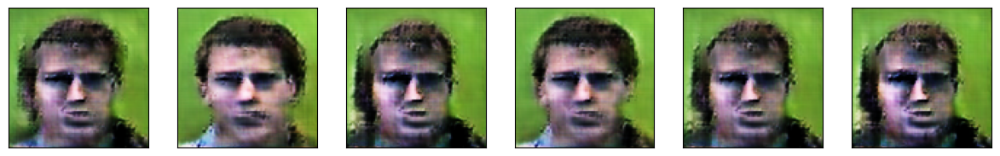

Epoch 45, gen loss=4.444570064544678,disc loss=0.5881579518318176, 0:00:20.94
1/1 [==============================] - 0s 13ms/step


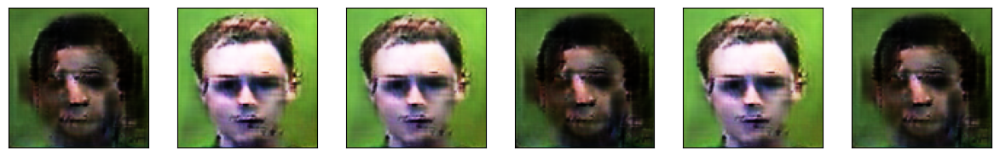

Epoch 46, gen loss=4.447187423706055,disc loss=0.5383445024490356, 0:00:21.05
1/1 [==============================] - 0s 14ms/step


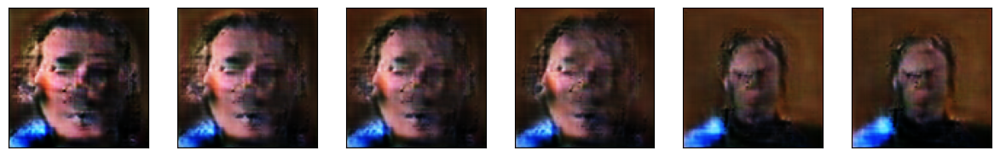

Epoch 47, gen loss=4.851978778839111,disc loss=0.6528207659721375, 0:00:21.02
1/1 [==============================] - 0s 13ms/step


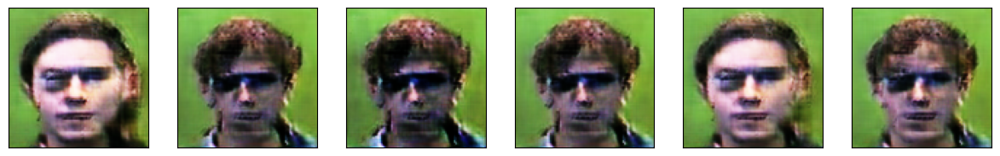

Epoch 48, gen loss=4.3966803550720215,disc loss=0.4859292209148407, 0:00:21.11
1/1 [==============================] - 0s 14ms/step


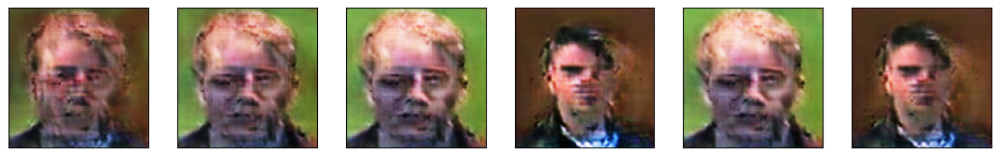

Epoch 49, gen loss=4.318569660186768,disc loss=0.4843524694442749, 0:00:21.22
1/1 [==============================] - 0s 13ms/step


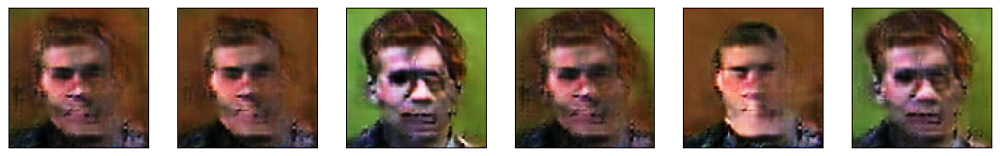

Epoch 50, gen loss=5.265844821929932,disc loss=0.6515048146247864, 0:00:20.95
1/1 [==============================] - 0s 14ms/step


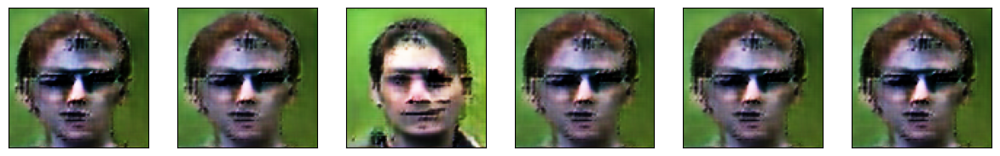

Training time: 1:20:23.18


In [93]:
train(train_dataset, EPOCHS)

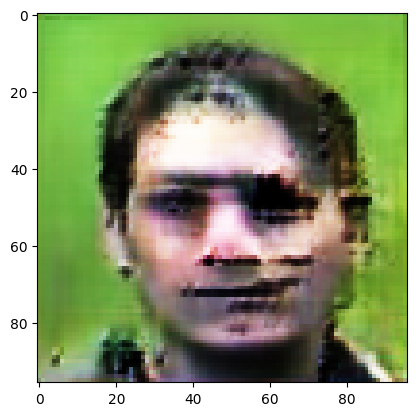

In [94]:
noise = tf.random.normal([1, SEED_SIZE])
generated_image = generator(noise, training=False)

plt.imshow((generated_image[0, :, :, :] + 1.0) / 2.0)